In [126]:
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import matplotlib
import matplotlib.pyplot as plt


font = {'weight' : 'normal',
        'size'   : 14}
matplotlib.rc('font', **font)

import pandas as pd
import seaborn as sns
import os.path as op
from scipy.io import loadmat

import mne 

from mne import Epochs, pick_types, events_from_annotations
from mne.datasets import sample
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.decoding import CSP

from sklearn.preprocessing import scale

import mne_connectivity

from corrts import *

Creating RawArray with float64 data, n_channels=128, n_times=7677
    Range : 0 ... 7676 =      0.000 ...   119.938 secs
Ready.


/tmp/ipykernel_302047/3630929516.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sfreq = float(datafile["Fs"])


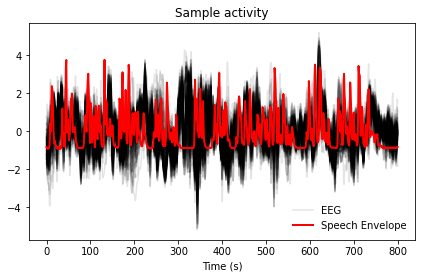

In [2]:
path = mne.datasets.mtrf.data_path()
decim = 2
datafile = loadmat(op.join(path, "speech_data.mat"))
raw = datafile["EEG"].T
speech = datafile["envelope"].T
sfreq = float(datafile["Fs"])
sfreq /= decim
speech = mne.filter.resample(speech, down=decim*2, npad="auto")
raw = mne.filter.resample(raw, down=decim, npad="auto")

# Read in channel positions and create our MNE objects from the raw data
montage = mne.channels.make_standard_montage("biosemi128")
info = mne.create_info(montage.ch_names, sfreq, "eeg").set_montage(montage)
raw = mne.io.RawArray(raw, info)
n_channels = len(raw.ch_names)

# Plot a sample of brain and stimulus activity
fig, ax = plt.subplots()
lns = ax.plot(scale(raw[:, :800][0].T), color="k", alpha=0.1)
ln1 = ax.plot(scale(speech[0, :800]), color="r", lw=2)
ax.legend([lns[0], ln1[0]], ["EEG", "Speech Envelope"], frameon=False)
ax.set(title="Sample activity", xlabel="Time (s)")
mne.viz.tight_layout()

In [407]:
data = raw.get_data()[None]

freq = np.linspace(1,15,15) 
rg   = 0.0005
# Nc   = np.maximum(1, np.round(np.sqrt((2 * np.pi * freq / raw.info['sfreq'])**2 / (2*rg))))
Nc = 7
# th_rg = (2 * np.pi * freq / raw.info['sfreq'])**2/ (2 * Nc**2)
print(Nc)
print(th_rg)

tfr  = mne.time_frequency.tfr_array_morlet(data, raw.info['sfreq'], freq, n_cycles=Nc, output='power', n_jobs=11, decim=2)
# tfr  = np.sqrt(tfr)
tfr  = tfr[:, :, :, :2*(tfr.shape[-1] // 2)]
tfr  = tfr**(1./4)

7
[1.33494260e-05 5.33977039e-05 1.20144834e-04 2.13590815e-04
 3.33735649e-04 4.80579335e-04 6.54121872e-04 8.54363262e-04
 1.08130350e-03 1.33494260e-03 1.61528054e-03 1.92231734e-03
 2.25605299e-03 2.61648749e-03 3.00362084e-03]


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=11)]: Done 105 tasks      | elapsed:    0.2s
[Parallel(n_jobs=11)]: Done 128 out of 128 | elapsed:    0.3s finished


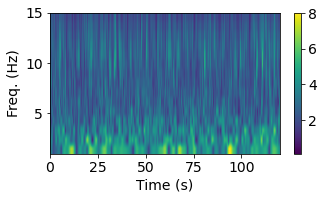

In [419]:
def plot_tfr(tfr, tvec, freq):
    extent = (tvec[0], tvec[-1], freq[0], freq[-1])

#     plt.subplot(2,1,1)
    plt.figure(figsize=(5,3))
    plt.imshow(tfr[raw.ch_names.index('A9')], aspect="auto", origin="lower", extent=extent)
    plt.xlabel('Time (s)')
    plt.ylabel('Freq. (Hz)')
    plt.colorbar()
    
#     plt.subplot(2,1,2)
#     plt.imshow(tfr[2], aspect="auto", origin="lower", extent=extent)
#     plt.xlabel('Time (ms)')
#     plt.ylabel('Freq. (Hz)')
    plt.tight_layout()
    plt.savefig('eeg-tfr-A9.pdf')
    
plot_tfr(tfr[:].mean(0), raw.times, freq);
# plot_tfr(np.log(tfr[ Ifeet].mean(0)), epochs.times, freq)


In [409]:
raw.times.shape, tfr.mean(0)[raw.ch_names.index('A9'),11].shape

((7677,), (3838,))

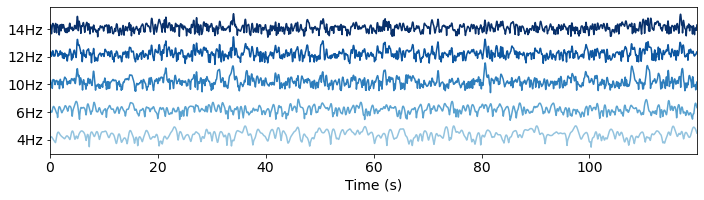

In [410]:
plt.figure(figsize=(10, 3))
fqs = [3, 5, 9, 11, 13] 
nfqs = len(fqs)
colors = plt.cm.Blues(np.linspace(0.4,1,nfqs))
for i in range(nfqs):
    plt.plot(raw.times[:-1:decim], tfr[0, raw.ch_names.index('A9'), fqs[i]] + 6*i, color=colors[i], linewidth=1.5)
plt.xlim([raw.times[0], raw.times[-2]])
plt.yticks(ticks=2+ 6*np.arange(nfqs), labels=[f'{fq+1}Hz' for fq in fqs])
plt.xlabel('Time (s)');
plt.tight_layout();
plt.savefig('eeg-power-example.pdf'); 

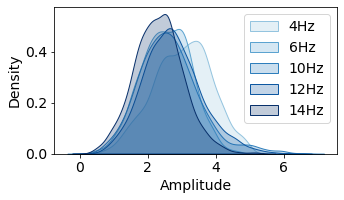

In [411]:
plt.figure(figsize=(5, 3))
for i, fq in enumerate(fqs):
    sns.kdeplot(tfr[0, raw.ch_names.index('A9'), fqs[i]], bw_method='silverman', color=colors[i], fill=True, label=f'{fq+1}Hz')
plt.legend()
plt.xlabel('Amplitude')
plt.tight_layout();
plt.savefig('eeg-power-hist.pdf'); 

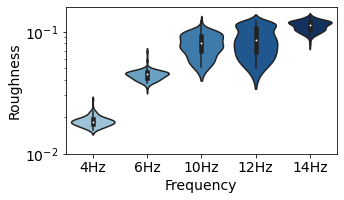

In [412]:
# Create an empty list to store the data
data = []

# Loop through the frequencies to generate the data for the plot
for i, fq in enumerate(fqs):
    roughness = estimate_roughness(tfr[0, :, fqs[i]])
    for value in roughness:
        data.append({'Frequency': f'{fq+1}Hz', 'Roughness': value})

# Convert the list of dictionaries into a DataFrame
df = pd.DataFrame(data)

plt.figure(figsize=(5,3))
sns.violinplot(x='Frequency', y='Roughness', data=df, palette=colors, scale='width')
plt.gca().set_yscale('log');
plt.yticks(ticks=[0.01, 0.1],labels=['$10^{-2}$', '$10^{-1}$'])
plt.tight_layout();

plt.savefig('eeg-power-rg.pdf'); 

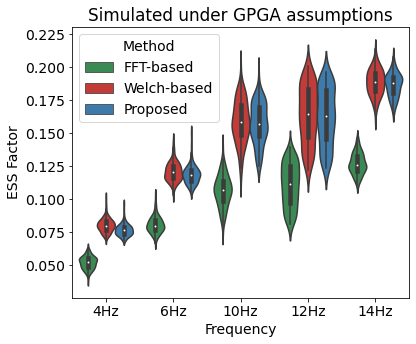

In [416]:
# Create an empty list to store the data
data = []

# Loop through the frequencies to generate the data for the plot
for i, fq in enumerate(fqs):
    roughness = estimate_roughness(tfr[0, :, fqs[i]])
    for value in roughness:
        sample = sample_random_process(tfr.shape[-1], r=value)
        
        acf = acf_fft(sample)
        edfs_fft = edfs_factor_bh(acf, acf)
        
        data.append({'Frequency': f'{fq+1}Hz', 'Roughness': value, 'Method': 'FFT-based', 'ESS Factor': edfs_fft})
        acf = acf_welch(sample)
        edfs_welch = edfs_factor_bh(acf, acf)
        
        data.append({'Frequency': f'{fq+1}Hz', 'Roughness': value, 'Method': 'Welch-based', 'ESS Factor': edfs_welch})
        
        edfs = edfs_factor_rft(sample, sample)
        
        data.append({'Frequency': f'{fq+1}Hz', 'Roughness': value, 'Method': 'Proposed', 'ESS Factor': edfs})
        

# Convert the list of dictionaries into a DataFrame
df = pd.DataFrame(data)


colors = [plt.cm.Greens(0.7), plt.cm.Reds(0.7), plt.cm.Blues(0.7),  ]

plt.figure(figsize=(6,5))
sns.violinplot(x='Frequency', y='ESS Factor', data=df, palette=colors, scale='width', hue='Method')
plt.title('Simulated under GPGA assumptions')

plt.tight_layout();
plt.savefig('eeg-power-sim-ess.pdf'); 


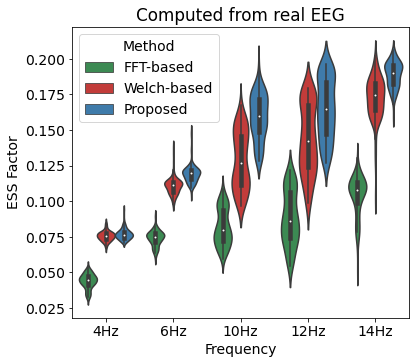

In [417]:
# Create an empty list to store the data
data = []

fqs = [3, 5, 9, 11, 13] 
nfqs = len(fqs)
colors = plt.cm.Blues(np.linspace(0.4,1,nfqs))

# Loop through the frequencies to generate the data for the plot
for i, fq in enumerate(fqs):
        
    acf = acf_fft(tfr[0, :, fqs[i]]); 
    edfs = edfs_factor_bh(acf, acf)
    for value in edfs:
        data.append({'Frequency': f'{fq+1}Hz', 'ESS Factor': value, 'Method': 'FFT-based'})
        
    acf = acf_welch(tfr[0, :, fqs[i]]); 
    edfs = edfs_factor_bh(acf, acf)
    for value in edfs:
        data.append({'Frequency': f'{fq+1}Hz', 'ESS Factor': value, 'Method': 'Welch-based'})
        
        
    edfs = edfs_factor_rft(tfr[0, :, fqs[i]], tfr[0, :, fqs[i]])
    for value in edfs:
        data.append({'Frequency': f'{fq+1}Hz', 'ESS Factor': value, 'Method': 'Proposed'})

# Convert the list of dictionaries into a DataFrame
df = pd.DataFrame(data)


colors = [plt.cm.Greens(0.7), plt.cm.Reds(0.7), plt.cm.Blues(0.7),  ]

plt.figure(figsize=(6,5))
sns.violinplot(x='Frequency', y='ESS Factor', data=df, palette=colors, scale='width', hue='Method')
plt.tight_layout();
plt.title('Computed from real EEG')

plt.savefig('eeg-power-ess.pdf'); 

In [281]:
acfs_fit.shape

(55, 128)

4.89e-01
7.70e-02
9.10e-01
1.59e-01
9.23e-01
1.89e-01


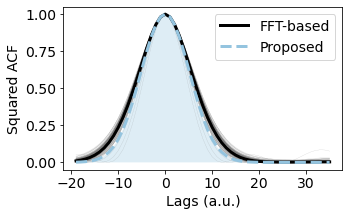

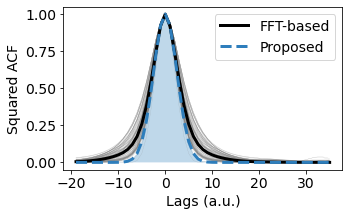

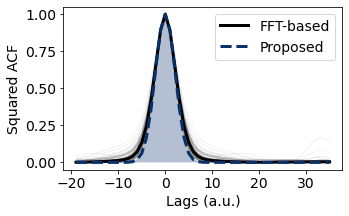

In [293]:
nlags = 20
lags = np.arange(-nlags+1, nlags+1+15)
fqs = [3, 9, 13]
nfqs = len(fqs)
colors = plt.cm.Blues(np.linspace(0.4,1,nfqs))
for i, fq in enumerate(fqs):
    acfs = acf_fft(tfr[0, :, fqs[i]])
    
    acfs = np.concatenate([acfs[...,-nlags+1:],acfs[...,:nlags+1+15]], axis=-1)
    
    acfs_fit = np.exp(-estimate_roughness(tfr[0, :, fqs[i]]) * lags[:, None]**2 / 2)
    
    plt.figure(figsize=(5,3))
    hs = plt.plot(lags, acfs.T**2, color='gray', linewidth=.2, alpha=0.5)
    h1, = plt.plot(lags, acfs.T.mean(1)**2, color='black', linewidth=3)
    h2, = plt.plot(lags, acfs_fit.mean(1)**2, '--', color=colors[i], linewidth=3)
    plt.fill_between(np.concatenate([lags, lags[::-1]]), np.concatenate([acfs_fit.mean(1)**2, acfs_fit.mean(1)**2*0]), facecolor=colors[i], alpha=0.3)
    plt.xlabel('Lags (a.u.)')
    plt.ylabel('Squared ACF')
    plt.legend(handles=[ h1, h2], labels=['FFT-based', 'Proposed'], loc='upper right')
    
    
    print(f'{(1/(acfs.T**2).sum(-1)).mean():.2e}')
    print(f'{(1/(acfs_fit**2).sum(0)).mean():.2e}')
    
    plt.savefig(f'acf_{fq+1}.pdf')

Paires de signaux -> regarder des correlations significatives qui deviennent non-significative apres correction

In [161]:
# fbands = dict(
#     delta = (freq[0], 4), 
#     theta = (4, 8), 
#     alpha = (8, 13),
#     beta  = (13, 30), 
# #     gamma = (30, freq[-1])
# )



fbands = {f'{i:.0f}':(i, i+1) for i in freq}

idxs = {k: np.where(np.logical_and(freq >= fmin, freq < fmax))[0]
       for k, (fmin, fmax) in fbands.items()}
 
pband  = {k: tfr[:,:,idx].sum(2) for k, idx in idxs.items()} 
acfs   = {k: acf_welch(p) for k, p in pband.items()} 
rgs    = {k: estimate_roughness(p) for k, p in pband.items()}
th_rgs = {k: th_rg[idx].mean() for k, idx in idxs.items()}

ssq_th = dict()
ssq_ev = dict()

nlags = 50
for k, acf in acfs.items(): 
    
#     if k == 'delta': continue
        
    fig = go.Figure()
    
    rg = th_rgs[k]
        
    acf_recon = np.concatenate([acf[:,:,-nlags+1:],acf[:,:,:nlags+1]], axis=-1)
    lags      = np.arange(-nlags+1, nlags+1)
        
    n = acf.shape[-1]
    acf_sums  = acf[..., 0]**2 + np.sum(2 * np.arange(n-1, 0, -1) * acf[...,1:n] **2, -1) / n
#     acf_sums  = acf.mean((0,1))[0]**2 + np.sum(2 * np.arange(n-1, 0, -1) * acf.mean((0,1))[...,1:n] **2, -1) / n
    
    acf_fit   = np.exp(-  lags[None, None, :]**2 * (rgs[k][:,:, None]) )
    
    print(f'{k}:\n' 
          f'    - sum of squares:     {acf_sums.mean():.2f} ({acf_sums.std():.2f})\n'
          f'    - known, theoretical: {np.sqrt(np.pi / (rg*4)):.2f}\n'
          f'    - knwon, sum of sq.:  {np.exp(- 2*lags**2 * (rg)  ).sum():.2f}\n'
          f'    - unkn., theoretical: {np.sqrt(np.pi/ rgs[k] ).mean():.2f}\n'
          f'    - unkn., sum of sq.:  {acf_fit.sum(-1).mean():.2f} ({acf_fit.sum(-1).std():.2f})\n')
#     plt.plot(lags, acf_recon**2)

    for i in range(acf.shape[0]):
        for j in range(acf.shape[1]):
            fig.add_scatter(x=lags, y=acf_recon[i,j]**2, showlegend=False, mode='lines', line_width=1, line_color='grey')
    
    fig.add_scatter(x=lags, y=acf_recon.mean((0,1))**2, showlegend=False, mode='lines', line_width=3, line_color='black')
    fig.add_scatter(x=lags, y=acf_fit.mean((0,1)), name='Gaussian fit',  showlegend=False, mode='lines', line_color='red', line_width=4, line_dash='dot')
    fig.add_annotation(x=35, y=1, text=f'Sum of squares: {acf_sums.mean():.2f} ({acf_sums.std():.2f})', showarrow=False) 
    fig.add_annotation(x=35, y=.9, text=f'Gaussian approx.: {np.sqrt(np.pi/ rgs[k] ).mean():.2f}', showarrow=False) 

#     fig.add_scatter(x=lags, y=np.exp(- 2* lags**2 * (rg) ), name='Gaussian fit',  showlegend=False, mode='lines', line_color='red', line_width=4, line_dash='dash')
    fig.update_layout(template='simple_white', height=400, width=600)
    
    fig.update_xaxes(title_text='Lag')
    fig.update_yaxes(title_text='Autocorrelation')
    fig.show()
    
    
    
    fig.write_image(f'freq_{k}_acf_fit.png')
    
    ssq_ev[k] = acf_sums.mean()
    ssq_th[k] = np.sqrt(2* np.pi/ rgs[k]).mean()

1:
    - sum of squares:     44.53 (3.10)
    - known, theoretical: 89.36
    - knwon, sum of sq.:  85.77
    - unkn., theoretical: 46.44
    - unkn., sum of sq.:  46.00 (4.39)



2:
    - sum of squares:     28.04 (1.97)
    - known, theoretical: 44.68
    - knwon, sum of sq.:  60.20
    - unkn., theoretical: 26.16
    - unkn., sum of sq.:  26.16 (2.03)



3:
    - sum of squares:     20.49 (1.15)
    - known, theoretical: 29.79
    - knwon, sum of sq.:  42.00
    - unkn., theoretical: 17.69
    - unkn., sum of sq.:  17.69 (0.83)



4:
    - sum of squares:     14.34 (0.75)
    - known, theoretical: 22.34
    - knwon, sum of sq.:  31.59
    - unkn., theoretical: 13.02
    - unkn., sum of sq.:  13.02 (0.59)



5:
    - sum of squares:     11.19 (0.58)
    - known, theoretical: 17.87
    - knwon, sum of sq.:  25.28
    - unkn., theoretical: 9.87
    - unkn., sum of sq.:  9.87 (0.45)



6:
    - sum of squares:     9.53 (0.50)
    - known, theoretical: 14.89
    - knwon, sum of sq.:  21.06
    - unkn., theoretical: 8.41
    - unkn., sum of sq.:  8.41 (0.40)



7:
    - sum of squares:     8.31 (0.46)
    - known, theoretical: 12.77
    - knwon, sum of sq.:  18.05
    - unkn., theoretical: 7.51
    - unkn., sum of sq.:  7.51 (0.20)



8:
    - sum of squares:     7.73 (0.95)
    - known, theoretical: 11.17
    - knwon, sum of sq.:  15.80
    - unkn., theoretical: 6.79
    - unkn., sum of sq.:  6.79 (0.21)



9:
    - sum of squares:     7.29 (0.64)
    - known, theoretical: 9.93
    - knwon, sum of sq.:  14.04
    - unkn., theoretical: 6.03
    - unkn., sum of sq.:  6.03 (0.27)



10:
    - sum of squares:     8.51 (1.43)
    - known, theoretical: 8.94
    - knwon, sum of sq.:  12.64
    - unkn., theoretical: 6.35
    - unkn., sum of sq.:  6.35 (0.67)



11:
    - sum of squares:     8.75 (1.73)
    - known, theoretical: 8.12
    - knwon, sum of sq.:  11.49
    - unkn., theoretical: 6.65
    - unkn., sum of sq.:  6.65 (0.88)



12:
    - sum of squares:     7.60 (1.42)
    - known, theoretical: 7.45
    - knwon, sum of sq.:  10.53
    - unkn., theoretical: 6.17
    - unkn., sum of sq.:  6.17 (0.82)



13:
    - sum of squares:     6.58 (0.97)
    - known, theoretical: 6.87
    - knwon, sum of sq.:  9.72
    - unkn., theoretical: 5.58
    - unkn., sum of sq.:  5.58 (0.51)



14:
    - sum of squares:     6.13 (0.75)
    - known, theoretical: 6.38
    - knwon, sum of sq.:  9.03
    - unkn., theoretical: 5.30
    - unkn., sum of sq.:  5.30 (0.26)



15:
    - sum of squares:     6.22 (0.72)
    - known, theoretical: 5.96
    - knwon, sum of sq.:  8.43
    - unkn., theoretical: 5.40
    - unkn., sum of sq.:  5.40 (0.16)



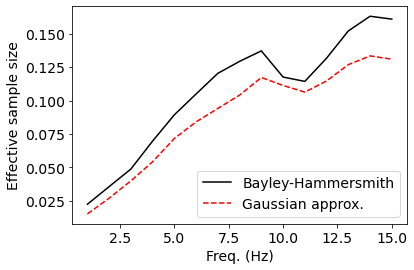

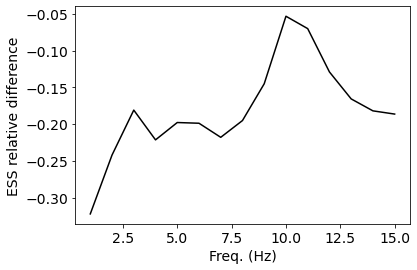

In [162]:
ess_ev = np.asarray([1/v for v in ssq_ev.values()])
ess_th = np.asarray([1/v for v in ssq_th.values()])


plt.plot(freq, ess_ev, 'k', freq, ess_th, 'r--')
plt.xlabel('Freq. (Hz)')
plt.ylabel('Effective sample size')
plt.legend(['Bayley-Hammersmith', 'Gaussian approx.'])
plt.savefig('ESS.pdf')
plt.show()

plt.plot(freq, ess_th/ess_ev - 1, 'k')
plt.xlabel('Freq. (Hz)')
plt.ylabel('ESS relative difference')

plt.savefig('ESS_difference.pdf')
plt.show()

In [9]:
eeg_speech_corr = spearman_r(tfr[0,:,:], speech)

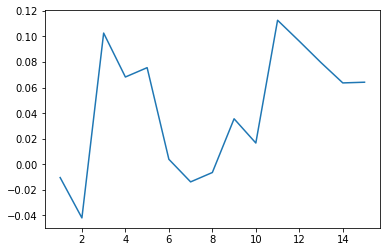

In [24]:
plt.plot(freq, eeg_speech_corr[raw.ch_names.index('A7')])

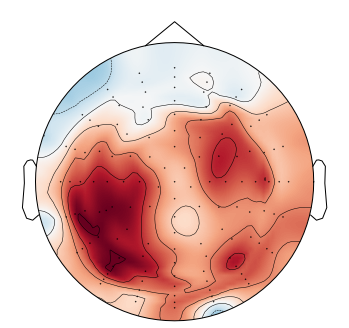

In [7]:
plt.rcParams['figure.figsize'] = (6,6)
mne.viz.plot_topomap(eeg_speech_corr.mean(1), raw.info, size=6); 

# for k, rs in pearson_rs.items():
#     mne.viz.plot_topomap(rs[0], raw.info, size=6)
#     plt.show()

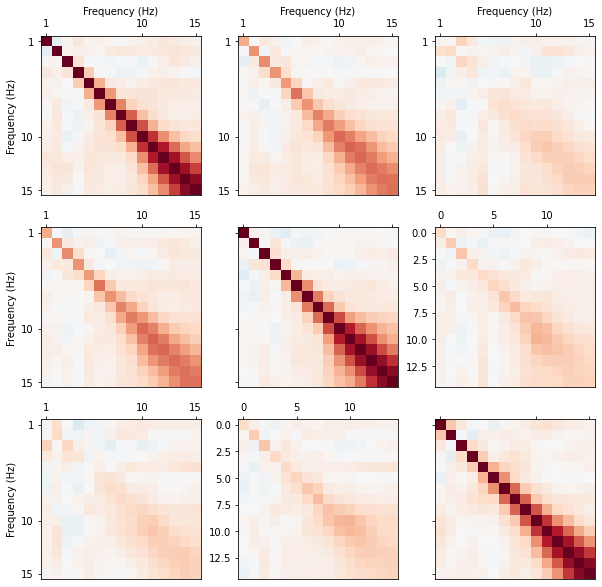

In [7]:
nc = 6
# ch_idx = np.argsort(np.abs(eeg_speech_corr).mean(1))[-nc//2:]
# ch_idx = np.concatenate([ch_idx, np.argsort(np.abs(eeg_speech_corr).mean(1))[:nc//2+1]])
# ch_names = [raw.ch_names[i] for i in ch_idx]

ch_names = ['D30', 'A18', 'B31']
nc = len(ch_names)
ch_idx = [raw.ch_names.index(ch) for ch in ch_names]

x = tfr[0, ch_idx, :, :] 

r = pearson_r(x[:, None, :, None], x[None, :, None, :])

vmin = r.min()
vmax = r.max()
vmin = -1
vmax = 1

f,axs = plt.subplots(nc,nc)
for i in range(nc):    
    plt.subplot(nc,nc,i+1 + i*nc)
#     plt.plot(freq, eeg_speech_corr[ch_idx[i]])
    
    plt.imshow(r[i,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#     plt.xticks([0, 9, 19], [1, 10, 20])
#     plt.yticks([0, 9, 19], [1, 10, 20])   
    
    axs[i, i].xaxis.set_ticks_position('top')   
    axs[i, i].xaxis.set_label_position('top')   
    plt.xticks([0, 9, 14], ['', '', ''])
    plt.yticks([0, 9, 14], ['', '', ''])
    
    if i == 0: 
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Frequency (Hz)')
        
        plt.xticks([0, 9, 14], [1, 10, 15])
        plt.yticks([0, 9, 14], [1, 10, 15])
        
    
    for j in range(nc):
        if j <= i: continue
            
        plt.subplot(nc,nc,j+1 + i*nc)
        plt.imshow(r[i,j], vmin=vmin, vmax=vmax, cmap='RdBu_r')
        
        
        axs[i, j].xaxis.set_ticks_position('top')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        if i == 0: 
            axs[i, j].xaxis.set_label_position('top')   
            plt.xlabel('Frequency (Hz)')
            
            plt.xticks([0, 9, 14], [1, 10, 15])
            plt.yticks([0, 9, 14], [1, 10, 15])
            
        plt.subplot(nc,nc,i+1 + j*nc)
        plt.imshow(r[j,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        axs[j, i].xaxis.set_ticks_position('top')
        
        if i == 0: 
            plt.ylabel('Frequency (Hz)')
            plt.xticks([0, 9, 14], [1, 10, 15])
            plt.yticks([0, 9, 14], [1, 10, 15])
    
    
    
f.set_figheight(10)
f.set_figwidth(10)
plt.savefig('coupling.png')

In [8]:
stats = stats_summary(pearson_r, x[:, None, :, None], x[None, :, None, :], n_surrogates=1024)

In [13]:
a = np.ones((10000, 3000)) / 3000
(a @ a.T)

/tmp/ipykernel_2686058/1462029141.py:2: RuntimeWarning:

invalid value encountered in matmul



array([[0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       ...,
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333]])

In [12]:
nc = 6
# ch_idx = np.argsort(np.abs(eeg_speech_corr).mean(1))[-nc//2:]
# ch_idx = np.concatenate([ch_idx, np.argsort(np.abs(eeg_speech_corr).mean(1))[:nc//2+1]])
# ch_names = [raw.ch_names[i] for i in ch_idx]

ch_names = ['D30', 'A18', 'B31']
nc = len(ch_names)
ch_idx = [raw.ch_names.index(ch) for ch in ch_names]

x = tfr[0, ch_idx, :, :] 

r = np.log10(stats['p']['rft']+ 1e-16)

vmin = r.min()
vmax = r.max()
# vmin = 0
# vmax = 1

f,axs = plt.subplots(nc,nc)
for i in range(nc):    
    plt.subplot(nc,nc,i+1 + i*nc)
#     plt.plot(freq, eeg_speech_corr[ch_idx[i]])
    
    plt.imshow(r[i,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#     plt.xticks([0, 9, 19], [1, 10, 20])
#     plt.yticks([0, 9, 19], [1, 10, 20])   
    
    axs[i, i].xaxis.set_ticks_position('top')   
    axs[i, i].xaxis.set_label_position('top')   
    plt.xticks([0, 9, 19], ['', '', ''])
    plt.yticks([0, 9, 19], ['', '', ''])
    
    if i == 0: 
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Frequency (Hz)')
        
        plt.xticks([0, 9, 19], [1, 10, 20])
        plt.yticks([0, 9, 19], [1, 10, 20])
        
    
    for j in range(nc):
        if j <= i: continue
            
        plt.subplot(nc,nc,j+1 + i*nc)
        plt.imshow(r[i,j], vmin=vmin, vmax=vmax, cmap='RdBu_r')
        
        
        axs[i, j].xaxis.set_ticks_position('top')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        if i == 0: 
            axs[i, j].xaxis.set_label_position('top')   
            plt.xlabel('Frequency (Hz)')
            
            plt.xticks([0, 9, 19], [1, 10, 20])
            plt.yticks([0, 9, 19], [1, 10, 20])
            
        plt.subplot(nc,nc,i+1 + j*nc)
        plt.imshow(r[j,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        axs[j, i].xaxis.set_ticks_position('top')
        
        if i == 0: 
            plt.ylabel('Frequency (Hz)')
            plt.xticks([0, 9, 19], [1, 10, 20])
            plt.yticks([0, 9, 19], [1, 10, 20])
    
    
    
f.set_figheight(10)
f.set_figwidth(10)
plt.savefig('coupling.png')

NameError: name 'stats' is not defined

In [18]:
x

array([[[ 3.56036321,  3.56805853,  3.57349273, ...,  5.68643524,
          5.66147581,  5.63554732],
        [ 3.08280678,  3.19763025,  3.3167623 , ...,  5.6916281 ,
          5.7202527 ,  5.73920581],
        [ 4.50948957,  4.62321333,  4.7280106 , ...,  5.43318086,
          5.41022308,  5.38051967],
        ...,
        [ 3.4622767 ,  3.84029026,  4.07013754, ...,  4.71099125,
          4.89896464,  4.96301446],
        [ 3.48244506,  3.82771512,  3.98314653, ...,  4.39613169,
          4.70720639,  4.84510716],
        [ 3.36944771,  3.66810884,  3.73742105, ...,  3.85299418,
          4.33766296,  4.60182628]],

       [[ 4.73383628,  4.78630688,  4.84003465, ...,  6.33688194,
          6.31051274,  6.28289509],
        [ 4.258027  ,  4.24853859,  4.23952049, ...,  5.70670046,
          5.76666193,  5.81313431],
        [ 4.95194284,  4.99964566,  5.03572505, ...,  6.33688956,
          6.31134523,  6.27637977],
        ...,
        [ 4.07235021,  4.52643835,  4.76728088, ...,  

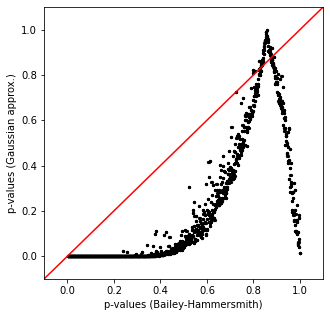

In [15]:
plt.rcParams['figure.figsize'] = (5,5)

plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(1 - rank(stats['r'].flatten()) / stats['r'].size, stats['p']['rft'].flatten(), c='k', s=5)
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('p-values (Bailey-Hammersmith)')
plt.ylabel('p-values (Gaussian approx.)')


plt.savefig('bh_rft.pdf')

Text(0, 0.5, 'p-values (Gaussian approx.)')

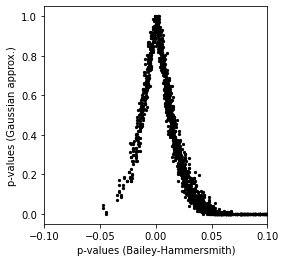

In [129]:
plt.rcParams['figure.figsize'] = (4,4)

# plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(stats['kappa']['rft'].flatten(), stats['ppng']['surrogates'].flatten(), c='k', s=5)
plt.xlim([-0.1,0.1])
# plt.ylim([-0.1,0.1])
plt.xlabel('p-values (Bailey-Hammersmith)')
plt.ylabel('p-values (Gaussian approx.)')


# plt.savefig('bh_rft.png')

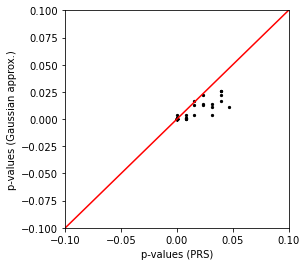

In [120]:
plt.rcParams['figure.figsize'] = (4,4)

plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(stats['p']['surrogates'][:,:,2:7,2:7].flatten(), stats['p']['rft'][:,:,2:7,2:7].flatten(), c='k', s=5)
plt.xlim([-0.1,0.1])
plt.ylim([-0.1,0.1])
plt.xlabel('p-values (PRS)')
plt.ylabel('p-values (Gaussian approx.)')


plt.savefig('bh_rft.png')

In [ ]:
pearson_rs  = {k: pearson_r(p, sqrt(speech[:, None, :])) for k, p in pband.items()}


In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

for k, rs in pearson_rs.items():
    mne.viz.plot_topomap(rs[0], raw.info, size=6)
    plt.show()

In [ ]:
pearson_stats  = {k: stats_summary(pearson_r,  p, speech[:, None, :], n_surrogates=1000) for k, p in pband.items()}
# spearman_stats = {k: stats_summary(spearman_r, p[:, 0], p[:, 1], n_surrogates=1000) for k, p in pband.items()}

In [ ]:
for k, rs in pearson_stats.items():
    mne.viz.plot_topomap(rs['p']['surrogates'][0]-rs['p']['rft'][0], raw.info, size=6)
    plt.show()

In [ ]:
rs['p']['surrogates'][0] - 1.96 * np.sqrt(rs['p']['surrogates'][0] * (1-rs['p']['surrogates'][0]) / 1000)

In [ ]:
for k, rs in pearson_stats.items():

    r     = np.squeeze(rs['r'])
    ii    = np.argsort(r)
    psurr = rs['p']['bh'][0][ii]
    prft  = rs['p']['rft'][0][ii]

    nsurr = 1000
    ci95  = 1.96 * np.sqrt(psurr * (1-psurr) / nsurr)

    ci95x1 = psurr - ci95
    ci95x2 = psurr + ci95

    ci95x = np.concatenate([psurr - ci95, (psurr + ci95)[::-1]])
    ci95y = np.concatenate([prft, prft[::-1]])

#     plt.errorbar(psurr, prft, xerr=ci95, fmt='none', ecolor='r')
    plt.scatter(psurr, prft, s=10, c='k')
    plt.plot([-0,1],[-0,1],'k')
    plt.xlim([-0,1])
    plt.ylim([-0,1])
    plt.xlabel('Bailey-Hammerslay p-values')
    plt.ylabel('Our p-values')
    plt.show()

In [ ]:
pband['alpha'].shape

In [ ]:
plt.plot(pband['alpha'][0])